In [1]:
import tensorflow as tf
import numpy as np
import cv2
from tensorflow.keras.layers import MaxPool2D,Conv2D,UpSampling2D,Input,Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import img_to_array
import os
from tqdm import tqdm
import re
import matplotlib.pyplot as plt


%matplotlib inline

path = ''
color_path = os.path.join(path, './landscape Images/color/') 
gray_path = os.path.join(path, './landscape Images/gray/')
color_list = os.listdir(color_path)
gray_list = os.listdir(gray_path)

color_list = [color_path+i for i in color_list]
gray_list = [gray_path+i for i in gray_list]

os.environ['KMP_DUPLICATE_LIB_OK']='True' # To solve the kernel dead

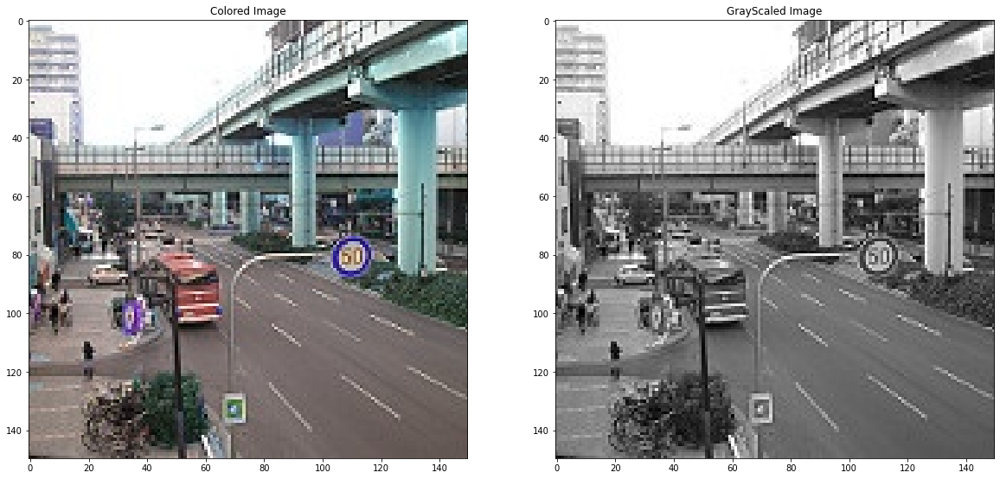

In [2]:
N = 3
color = cv2.imread(color_list[N])
gray = cv2.imread(gray_list[N])

plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.title(label="Colored Image", )
plt.imshow(color)

plt.subplot(1,2,2)
plt.title(label="GrayScaled Image")
plt.imshow(gray)


In [3]:
color.shape

(150, 150, 3)

In [4]:
gray.shape

(150, 150, 3)

In [5]:
def NormalizeImages(image_list, SIZE_WIDTH, SIZE_LENGTH):
    img_list = []
    for i in range(len(image_list)):
        img = cv2.imread(image_list[i])
        img = cv2.resize(img, (SIZE_WIDTH, SIZE_LENGTH))
        img = img.astype('float32') / 255.0
        img_list.append(img_to_array(img))
    return np.asarray(img_list)

In [6]:
SIZE_WIDTH = 160 
SIZE_LENGTH = 160
color_list_Norm = NormalizeImages(image_list=color_list, SIZE_WIDTH=SIZE_WIDTH, SIZE_LENGTH=SIZE_LENGTH)
gray_list_Norm = NormalizeImages(image_list=gray_list, SIZE_WIDTH=SIZE_WIDTH, SIZE_LENGTH=SIZE_LENGTH)

In [7]:
color_list_Norm.shape

(7129, 160, 160, 3)

In [8]:
gray_list_Norm.shape

(7129, 160, 160, 3)

In [9]:
train_gray_image = gray_list_Norm[:6000]
train_color_image = color_list_Norm[:6000]

test_gray_image = gray_list_Norm[6000:]
test_color_image = color_list_Norm[6000:]

train_gray_image = np.reshape(train_gray_image,(len(train_gray_image),SIZE_WIDTH,SIZE_LENGTH,3))
train_color_image = np.reshape(train_color_image, (len(train_color_image),SIZE_WIDTH,SIZE_LENGTH,3))

test_gray_image = np.reshape(test_gray_image,(len(test_gray_image),SIZE_WIDTH,SIZE_LENGTH,3))
test_color_image = np.reshape(test_color_image, (len(test_color_image),SIZE_WIDTH,SIZE_LENGTH,3))

In [10]:
train_color_image.shape

(6000, 160, 160, 3)

In [11]:
train_gray_image.shape

(6000, 160, 160, 3)

In [12]:
test_color_image.shape

(1129, 160, 160, 3)

In [13]:
test_gray_image.shape

(1129, 160, 160, 3)

In [20]:
def down(filters , kernel_size, apply_batch_normalization = True):
    downsample = tf.keras.models.Sequential()
    downsample.add(tf.keras.layers.Conv2D(filters,kernel_size,padding = 'same', strides = 2))
    if apply_batch_normalization:
        downsample.add(tf.keras.layers.BatchNormalization())
    downsample.add(tf.keras.layers.LeakyReLU())
    return downsample


def up(filters, kernel_size, dropout = False):
    upsample = tf.keras.models.Sequential()
    upsample.add(tf.keras.layers.Conv2DTranspose(filters, kernel_size,padding = 'same', strides = 2))
    if dropout:
        upsample.dropout(0.2)
    upsample.add(tf.keras.layers.LeakyReLU())
    return upsample

In [23]:
def model():
    inputs = tf.keras.layers.Input(shape= [160,160,3])
    d1 = down(128,(3,3),False)(inputs)
    d2 = down(128,(3,3),False)(d1)
    d3 = down(256,(3,3),True)(d2)
    d4 = down(512,(3,3),True)(d3)
    
    d5 = down(512,(3,3),True)(d4)
    
    u1 = up(512,(3,3),False)(d5)
    u1 = tf.keras.layers.concatenate([u1,d4])
    u2 = up(256,(3,3),False)(u1)
    u2 = tf.keras.layers.concatenate([u2,d3])
    u3 = up(128,(3,3),False)(u2)
    u3 = tf.keras.layers.concatenate([u3,d2])
    u4 = up(128,(3,3),False)(u3)
    u4 = tf.keras.layers.concatenate([u4,d1])
    u5 = up(3,(3,3),False)(u4)
    u5 = tf.keras.layers.concatenate([u5,inputs])
    output = tf.keras.layers.Conv2D(3,(2,2),strides = 1, padding = 'same')(u5)
    return tf.keras.Model(inputs=inputs, outputs=output)

In [24]:
model = model()
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
sequential_13 (Sequential)      (None, 80, 80, 128)  3584        input_4[0][0]                    
__________________________________________________________________________________________________
sequential_14 (Sequential)      (None, 40, 40, 128)  147584      sequential_13[0][0]              
__________________________________________________________________________________________________
sequential_15 (Sequential)      (None, 20, 20, 256)  296192      sequential_14[0][0]              
______________________________________________________________________________________________

In [30]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001),
              loss='mean_absolute_error',
              metrics=['accuracy'])

In [33]:
model.fit(train_color_image, train_gray_image,epochs = 1, batch_size = 50,verbose = 0)

In [34]:
model.evaluate(test_gray_image,test_color_image)

36/36 [==============================] - 94s 969ms/step - loss: 0.0784 - accuracy: 0.3155


[0.07844024151563644, 0.3154597878456116]

In [35]:
def plot_images(color,grayscale,predicted):
    plt.figure(figsize=(15,15))
    
    plt.subplot(1,3,1)
    plt.title('Color Image', color = 'green', fontsize = 20)
    plt.imshow(color)
    
    plt.subplot(1,3,2)
    plt.title('Grayscale Image ', color = 'black', fontsize = 20)
    plt.imshow(grayscale)
    
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()


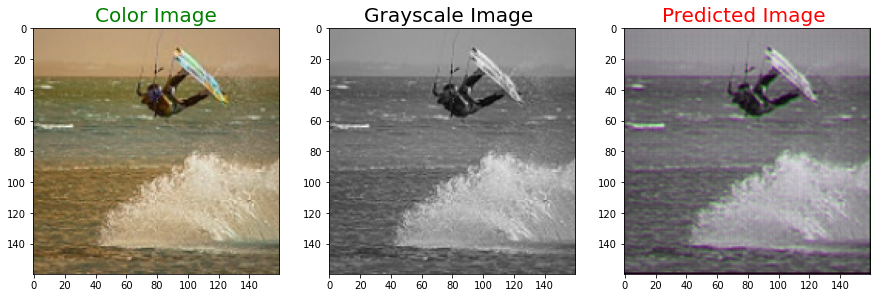

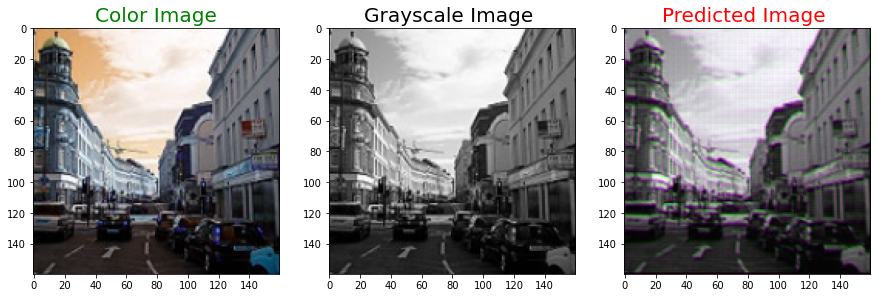

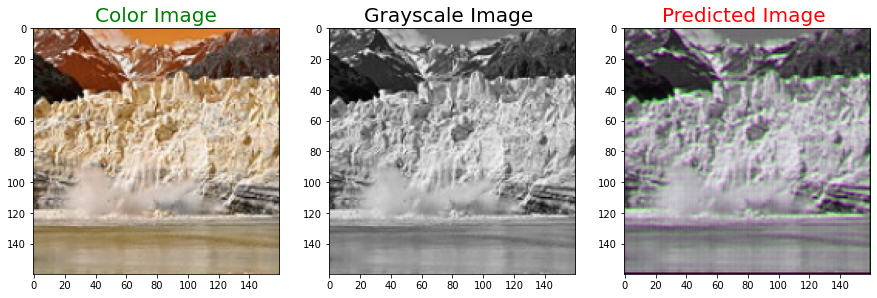

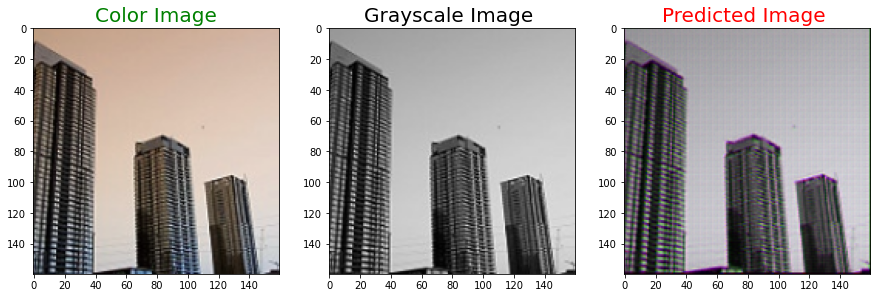

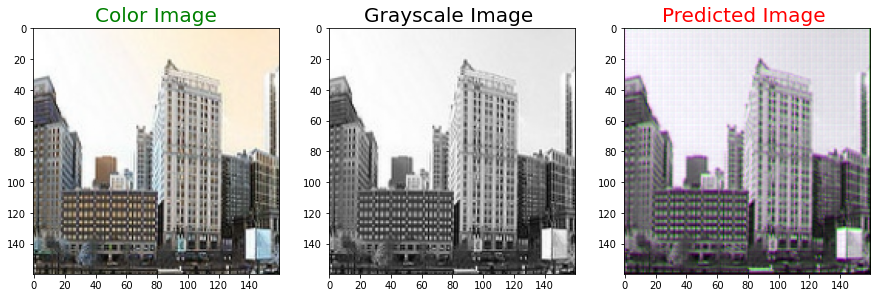

...

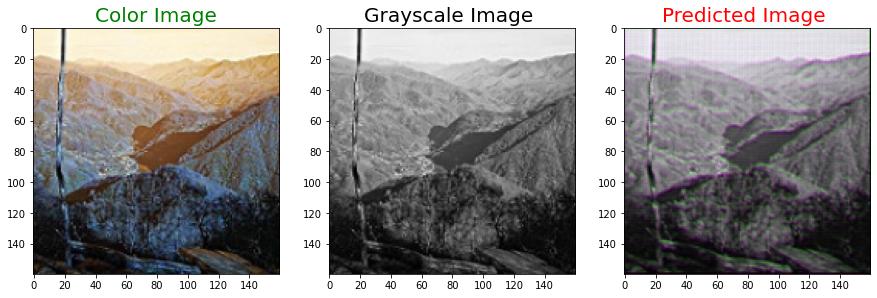

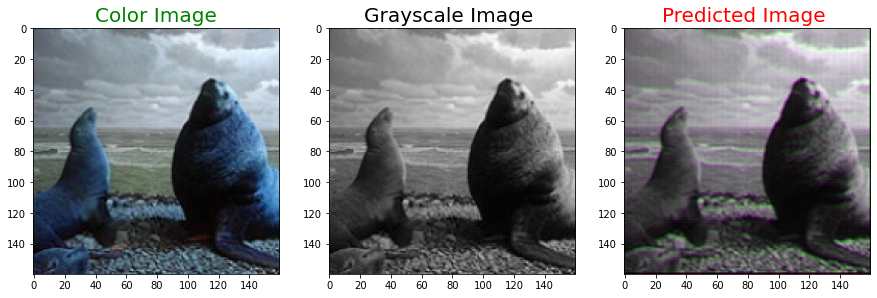

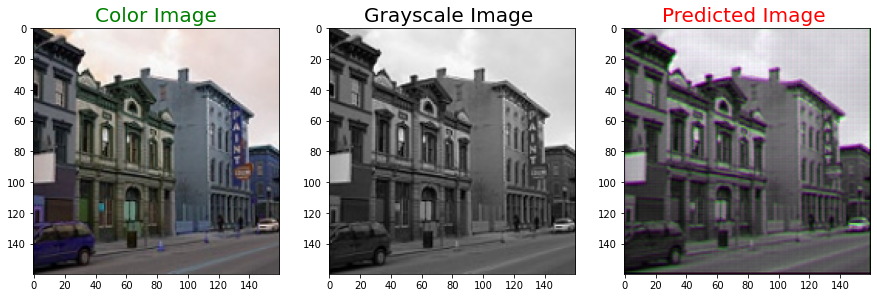

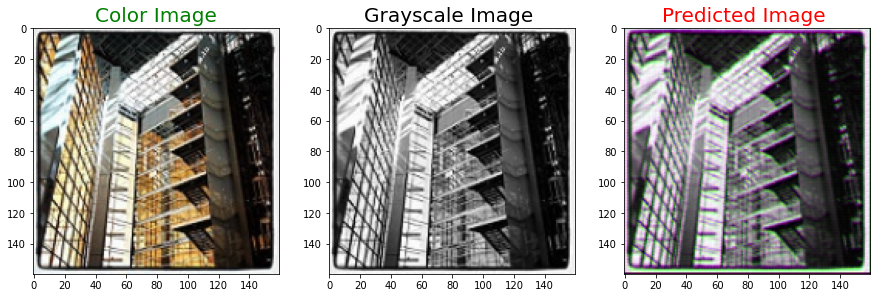

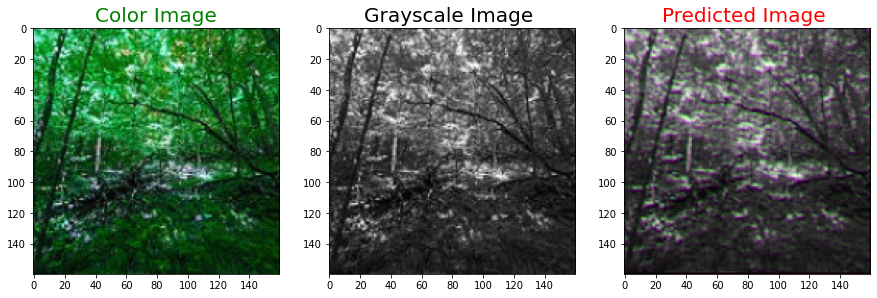

In [37]:
for i in range(1,50):
    predicted = np.clip(model.predict(test_gray_image[i].reshape(1,SIZE_WIDTH, SIZE_LENGTH,3)),0.0,1.0).reshape(SIZE_WIDTH, SIZE_LENGTH,3)
    plot_images(test_color_image[i],test_gray_image[i],predicted)

In [ ]:
%%javascript
IPython.notebook.save_checkpoint();
if (confirm("Clear memory?") == true)
{
    IPython.notebook.kernel.restart();
}